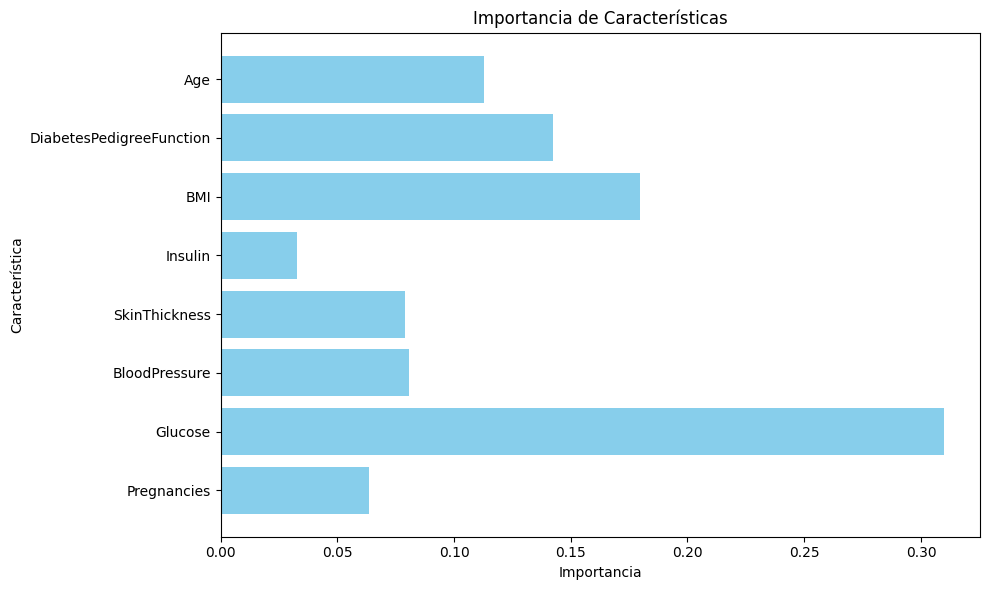

Puntuación de precisión promedio: 0.726
Pregnancies: 0.054
Glucose: 0.313
BloodPressure: 0.074
SkinThickness: 0.085
Insulin: 0.034
BMI: 0.185
DiabetesPedigreeFunction: 0.128
Age: 0.127


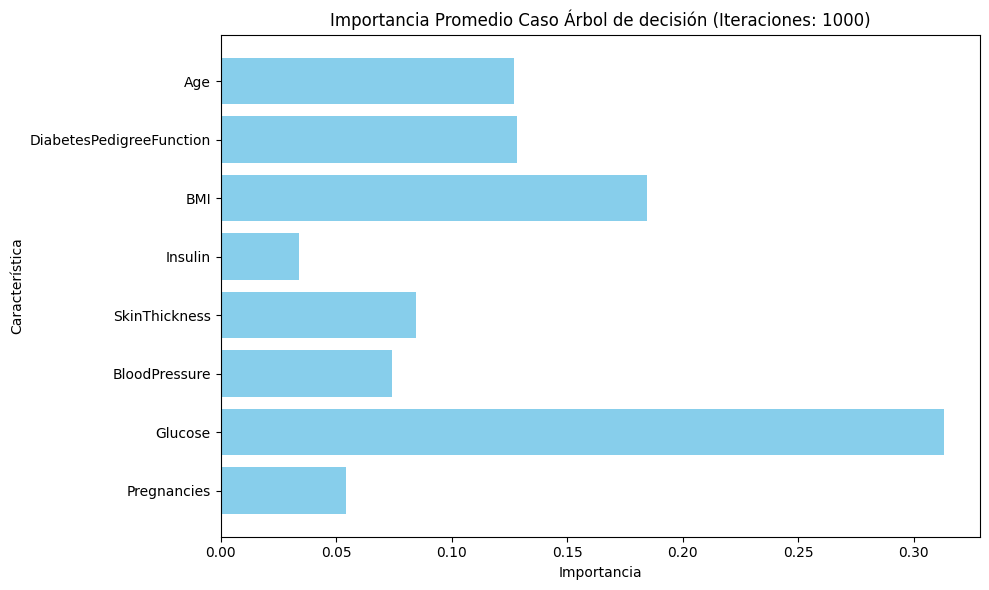

In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

class PrecisionImportancias:
    """
    Implementa un modelo de clasificación usando árboles de decisión para determinar la importancia de características y la precisión del modelo.

    Args:
    - data_path (str): Ruta al archivo CSV que contiene los datos de entrenamiento y prueba.

    Métodos:
    - __init__(data_path): Inicializa el objeto cargando datos, dividiéndolos en conjuntos de entrenamiento y prueba, y entrenando el modelo de árbol de decisión.
    - display_results(): Muestra la precisión del modelo y la importancia de las características calculadas por el árbol de decisión.
    - __str__(): Devuelve una representación legible del objeto PrecisionImportancias.
    """

    def __init__(self, data_path):
        """
        Inicializa el objeto PrecisionImportancias cargando datos, dividiéndolos en conjuntos de entrenamiento y prueba, y entrenando el modelo.

        Args:
        - data_path (str): Ruta al archivo CSV que contiene los datos de entrenamiento y prueba.
        """
        self.__data_path = data_path
        self.__data = pd.read_csv(data_path)
        self.__x_data = self.__data.drop(["Outcome"], axis=1)
        self.__y = self.__data.Outcome.values
        self.__x = (self.__x_data - np.min(self.__x_data)) / (np.max(self.__x_data) - np.min(self.__x_data))
        self.__x_train, self.__x_test, self.__y_train, self.__y_test = train_test_split(self.__x, self.__y, test_size=0.25, random_state=73)
        self.__dt = DecisionTreeClassifier()
        self.__feature_importance_df = None
        self.__accuracy = None
        self.__train_model()

    def __train_model(self):
        """
        Entrena el modelo de árbol de decisión y calcula la precisión del modelo y la importancia de las características.
        """
        self.__dt.fit(self.__x_train, self.__y_train)
        self.__accuracy = self.__dt.score(self.__x_test, self.__y_test)

        feature_importances = self.__dt.feature_importances_
        self.__feature_importance_df = pd.DataFrame({
            'Feature': self.__x.columns,
            'Importance': feature_importances
        })

    def display_results(self):
        """
        Muestra la precisión del modelo y la importancia de las características.

        Ejemplo de salida:
        Puntuación de precisión: 0.85
        Feature1: 0.30
        Feature2: 0.20
        ...
        """
        print(f"Puntuación de precisión: {self.__accuracy:.3f}")
        for feature, importance in zip(self.__feature_importance_df['Feature'], self.__feature_importance_df['Importance']):
            print(f"{feature}: {importance:.3f}")

    @property
    def data_path(self):
        """Getter para el atributo data_path."""
        return self.__data_path

    @data_path.setter
    def data_path(self, value):
        """
        Setter para el atributo data_path que carga nuevos datos y reentrena el modelo.

        Args:
        - value (str): Nueva ruta al archivo CSV que contiene los datos de entrenamiento y prueba.
        """
        self.__data_path = value
        self.__data = pd.read_csv(value)
        self.__x_data = self.__data.drop(["Outcome"], axis=1)
        self.__y = self.__data.Outcome.values
        self.__x = (self.__x_data - np.min(self.__x_data)) / (np.max(self.__x_data) - np.min(self.__x_data))
        self.__x_train, self.__x_test, self.__y_train, self.__y_test = train_test_split(self.__x, self.__y, test_size=0.2, random_state=73)
        self.__dt = DecisionTreeClassifier()
        self.__train_model()

    @property
    def accuracy(self):
        """Getter para el atributo accuracy."""
        return self.__accuracy

    @property
    def feature_importance_df(self):
        """Getter para el atributo feature_importance_df."""
        return self.__feature_importance_df

    @property
    def dt(self):
        """Getter para el atributo dt (modelo de árbol de decisión)."""
        return self.__dt

    @property
    def data(self):
        """Getter para el atributo data (datos cargados desde CSV)."""
        return self.__data

    def __str__(self):
        """Devuelve una representación legible del objeto PrecisionImportancias."""
        return f'PrecisionImportancias(data_path={self.__data_path}, accuracy={self.__accuracy:.3f})'



class PrecisionImportanciasGrafico:
    """
    Implementa la visualización gráfica de la importancia de características utilizando un gráfico de barras horizontales.

    Args:
    - feature_importance_df (pd.DataFrame): DataFrame que contiene dos columnas 'Feature' y 'Importance' con nombres de características y su importancia respectivamente.

    Métodos:
    - __init__(feature_importance_df): Inicializa el objeto y muestra automáticamente el gráfico de barras horizontales de importancia de características.
    - __plot_feature_importances(): Método privado que realiza la visualización del gráfico de barras horizontales.
    - __str__(): Devuelve una representación legible del objeto PrecisionImportanciasGrafico.
    """

    def __init__(self, feature_importance_df):
        """
        Inicializa el objeto PrecisionImportanciasGrafico con un DataFrame de importancia de características y muestra el gráfico correspondiente.

        Args:
        - feature_importance_df (pd.DataFrame): DataFrame que contiene las columnas 'Feature' y 'Importance' con nombres de características y su importancia respectivamente.
        """
        self.__feature_importance_df = feature_importance_df
        self.__plot_feature_importances()

    @property
    def feature_importance_df(self):
        """Getter para el atributo feature_importance_df."""
        return self.__feature_importance_df

    def __plot_feature_importances(self):
        """
        Realiza la visualización del gráfico de barras horizontales de importancia de características.
        """
        plt.figure(figsize=(10, 6))
        plt.barh(self.__feature_importance_df['Feature'], self.__feature_importance_df['Importance'], color='skyblue')
        plt.xlabel('Importancia')
        plt.ylabel('Característica')
        plt.title('Importancia de Características')
        plt.tight_layout()
        plt.show()

    def __str__(self):
        """Devuelve una representación legible del objeto PrecisionImportanciasGrafico."""
        return 'PrecisionImportanciasGrafico()'


class ArbolDecision:
    """
    Implementa la visualización gráfica de un árbol de decisión entrenado.

    Args:
    - model (modelo de árbol de decisión): Modelo de árbol de decisión entrenado que se va a visualizar.
    - data_columns (list): Lista de nombres de columnas/features utilizadas en el modelo.

    Métodos:
    - __init__(model, data_columns): Inicializa el objeto y muestra automáticamente la representación gráfica del árbol de decisión.
    - __plot_tree(): Método privado que realiza la visualización del árbol de decisión utilizando matplotlib y la función plot_tree.
    - __str__(): Devuelve una representación legible del objeto ArbolDecision.
    """

    def __init__(self, model, data_columns):
        """
        Inicializa el objeto ArbolDecision con un modelo de árbol de decisión y los nombres de columnas/features.

        Args:
        - model (modelo de árbol de decisión): Modelo de árbol de decisión entrenado que se va a visualizar.
        - data_columns (list): Lista de nombres de columnas/features utilizadas en el modelo.
        """
        self.__model = model
        self.__data_columns = data_columns
        self.__plot_tree()

    @property
    def model(self):
        """Getter para el atributo model."""
        return self.__model

    @model.setter
    def model(self, value):
        """Setter para el atributo model."""
        self.__model = value

    @property
    def data_columns(self):
        """Getter para el atributo data_columns."""
        return self.__data_columns

    @data_columns.setter
    def data_columns(self, value):
        """Setter para el atributo data_columns."""
        self.__data_columns = value

    def __plot_tree(self):
        """
        Realiza la visualización del árbol de decisión utilizando matplotlib y la función plot_tree.
        """
        plt.figure(figsize=(400, 200))
        plot_tree(self.__model, feature_names=self.__data_columns, class_names=['Non-Diabetic', 'Diabetic'], filled=True)
        plt.show()

    def __str__(self):
        """Devuelve una representación legible del objeto ArbolDecision."""
        return f'ArbolDecision(model={self.__model}, data_columns={self.__data_columns})'




class PromediosPrecisionImportancias:
    """
    Implementa la ejecución iterativa de la clase PrecisionImportancias para calcular la precisión promedio y la importancia promedio de características.

    Args:
    - data_path (str): Ruta al archivo CSV que contiene los datos de entrenamiento y prueba para PrecisionImportancias.
    - n_iterations (int): Número de iteraciones para ejecutar PrecisionImportancias y calcular promedios.

    Métodos:
    - __init__(data_path, n_iterations): Inicializa el objeto y realiza automáticamente las iteraciones especificadas para calcular los promedios.
    - _run_iterations(): Método privado que ejecuta las iteraciones de PrecisionImportancias y calcula la precisión promedio y la importancia promedio de características.
    - _print_results(): Método privado que imprime la precisión promedio y la importancia promedio de características calculadas.
    - plot_feature_importances(): Método que muestra un gráfico de barras horizontales de la importancia promedio de características.

    Atributos:
    - mean_accuracy (float): Precisión promedio calculada sobre las iteraciones.
    - mean_feature_importance_df (pd.DataFrame): DataFrame que contiene la importancia promedio de características calculada sobre las iteraciones.
    """

    def __init__(self, data_path, n_iterations):
        """
        Inicializa el objeto PromediosPrecisionImportancias con la ruta al archivo CSV y el número de iteraciones.

        Args:
        - data_path (str): Ruta al archivo CSV que contiene los datos de entrenamiento y prueba para PrecisionImportancias.
        - n_iterations (int): Número de iteraciones para ejecutar PrecisionImportancias y calcular promedios.
        """
        self.data_path = data_path
        self.n_iterations = n_iterations
        self.mean_accuracy = None
        self.mean_feature_importance_df = None

        np.random.seed(3435)  # set seed para tener consistencia al ejecutar sobre una misma cantidad
        self._run_iterations()
        self._print_results()
        self.plot_feature_importances()

    def _run_iterations(self):
        """
        Ejecuta las iteraciones de PrecisionImportancias y calcula la precisión promedio y la importancia promedio de características.
        """
        accuracies = []
        feature_importances_list = []

        for _ in range(self.n_iterations):
            prec_import = PrecisionImportancias(self.data_path)
            accuracies.append(prec_import.accuracy)
            feature_importances_list.append(prec_import.feature_importance_df['Importance'].values)

        self.mean_accuracy = np.mean(accuracies)
        mean_feature_importances = np.mean(feature_importances_list, axis=0)
        self.mean_feature_importance_df = pd.DataFrame({
            'Feature': prec_import.feature_importance_df['Feature'],
            'Importance': mean_feature_importances
        })

    def _print_results(self):
        """
        Imprime la precisión promedio y la importancia promedio de características calculadas.
        """
        print(f"Puntuación de precisión promedio: {self.mean_accuracy:.3f}")
        for feature, importance in zip(self.mean_feature_importance_df['Feature'], self.mean_feature_importance_df['Importance']):
            print(f"{feature}: {importance:.3f}")

    def plot_feature_importances(self):
        """
        Muestra un gráfico de barras horizontales de la importancia promedio de características.
        """
        plt.figure(figsize=(10, 6))
        plt.barh(self.mean_feature_importance_df['Feature'], self.mean_feature_importance_df['Importance'], color='skyblue')
        plt.xlabel('Importancia')
        plt.ylabel('Característica')
        plt.title(f'Importancia Promedio Caso Árbol de decisión (Iteraciones: {self.n_iterations})')
        plt.tight_layout()
        plt.show()


data = "D:\Descargas\diabetes.csv"

prec_import = PrecisionImportancias(data)

prec_import_grafico = PrecisionImportanciasGrafico(prec_import.feature_importance_df)

arbol_decision = ArbolDecision(prec_import.dt, prec_import.data.columns[:-1])

n_iterations = 1000
iter_prec_import = PromediosPrecisionImportancias(data, n_iterations)

